In [1]:
from pathlib import Path

from adain_model import AdaINModel, AdaINLoss
from adain_datamodule import AdaINDataModule
from adain_trainer import AdaINTrainer

import os
os.environ["KERAS_BACKEND"] = "torch"
import keras
import torch

In [ ]:
run_id = 'e256dfe6dcdf4a8b85dd9040a7992cf1'
train_epochs = 7
start_epoch = 1
dataset_size = 100000
lr = 1e-4
decay_rate = 0
decay_steps = 10
style_loss_weight = 2
tv_weight = 0
additional_tags = {'Upsampling' : 'Bilinear'}

In [3]:
dm = AdaINDataModule(Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/unlabeled2017/"), Path("D:/StyleTransferAI/StyleTransferAI_AdaIN/datasets/WikiArt/"), dataset_size=dataset_size, seed=444, batch_size=8)
if run_id != '' :
    model = AdaINModel.load_from_mlflow(run_id, Path("D:/Python/ML Flow/mlruns"))
else :
    model = AdaINModel()
    model.compile(optimizer='adam')
if decay_rate != 0 :
    model.optimizer.learning_rate = keras.optimizers.schedules.InverseTimeDecay(initial_learning_rate=lr, decay_steps=decay_steps, decay_rate=decay_rate)
else :
    model.optimizer.learning_rate = lr
model.loss_ = AdaINLoss(style_loss_weight=style_loss_weight, tv_weight=tv_weight)

In [4]:
total_epochs = start_epoch + train_epochs
trainer = AdaINTrainer(model, dm, 'adam', mlflow_dir=Path("D:/Python/ML Flow/mlruns"), mlflow_tags={"Dataset size" : dataset_size, "Real training" : True, "Total epochs" : f'{total_epochs} ({10*total_epochs} Keras epochs)', "Start epoch" : start_epoch, **additional_tags})
trainer.train(epochs=10*train_epochs, steps_per_epoch=1000, log_every_n_epochs=10, validation_steps=200, test_steps=200)

Initiating datasets...
Compiling the model...
Model is ready to be trained
Training the model...


Epoch 1/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 545s 545ms/step - loss: 679456.1250 - val_loss: 361779.0938
Epoch 2/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 599s 599ms/step - loss: 346817.3125 - val_loss: 297187.0938
Epoch 3/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 599s 599ms/step - loss: 288835.2188 - val_loss: 259868.9531
Epoch 4/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 598s 598ms/step - loss: 253927.2656 - val_loss: 241257.4062
Epoch 5/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 609s 609ms/step - loss: 234061.7656 - val_loss: 236653.2344
Epoch 6/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 598s 598ms/step - loss: 225640.0781 - val_loss: 209532.5938
Epoch 7/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 584s 584ms/step - loss: 215517.6250 - val_loss: 212523.8125
Epoch 8/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 607s 607ms/step - loss: 208062.4688 - val_loss: 204544.6875
Epoch 9/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 623s 623ms/step - loss: 201340.1094 - val_loss: 201153.1875
Epoch 10/10
1000/1000 ━━━━━━━━━━━━━━━━━━━━ 636s 636ms/step - loss: 198502.5312 - v

In [5]:
imgs = []
torch.random.manual_seed(444)
for i, ((content, style), _) in enumerate(dm._train_dataset) :
    if i == 20 :
        break
    gen_img = model.generate(content, style)
    imgs.append([content.type(torch.int), style.type(torch.int), gen_img])

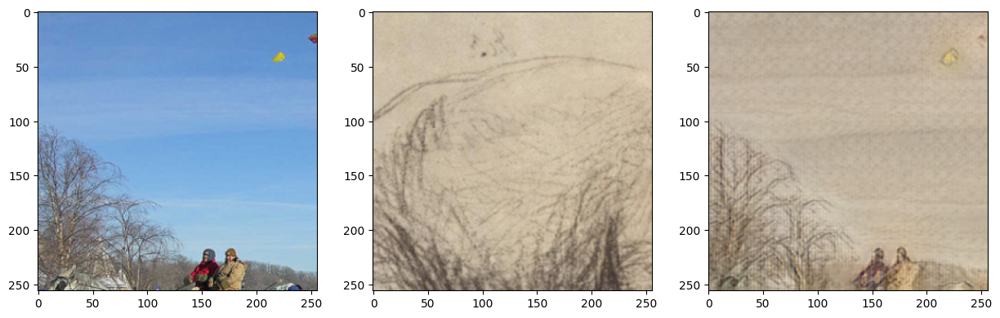

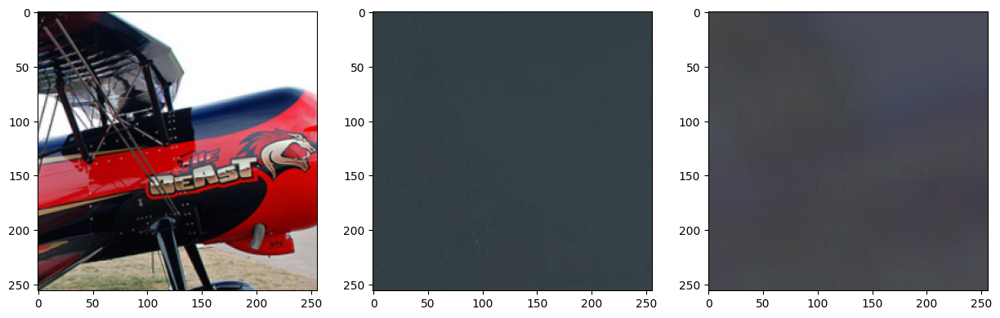

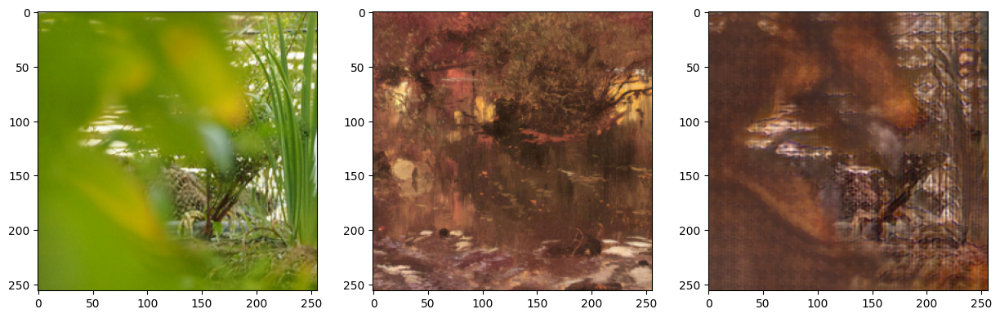

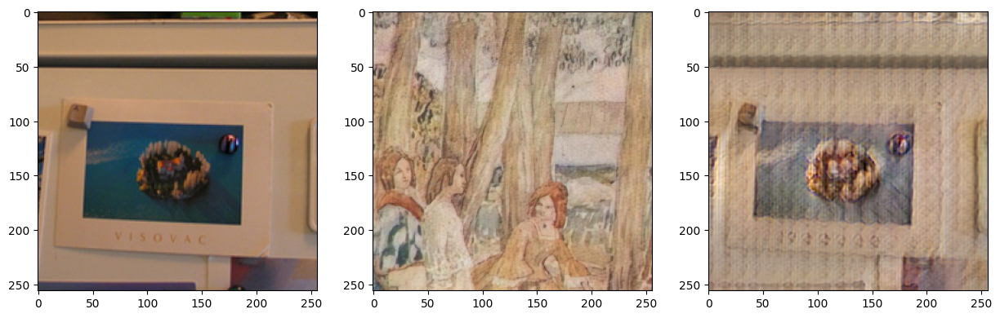

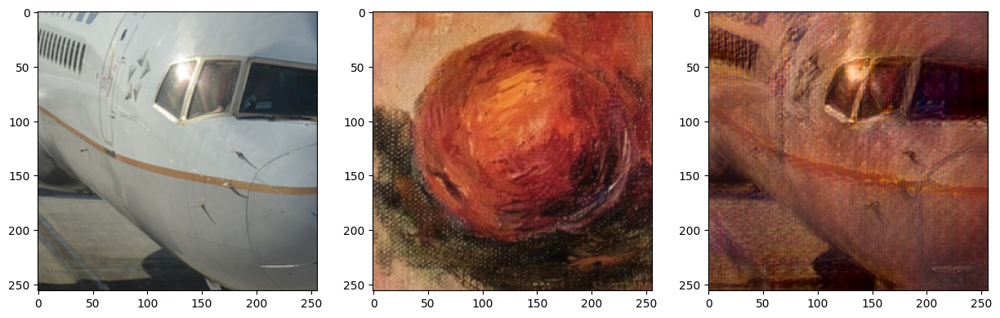

...

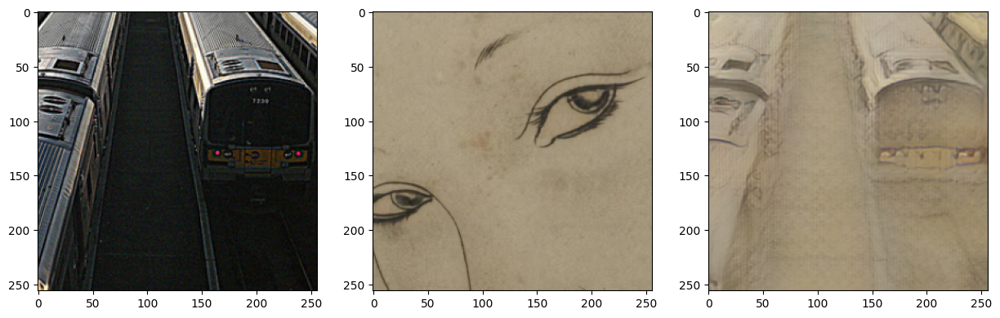

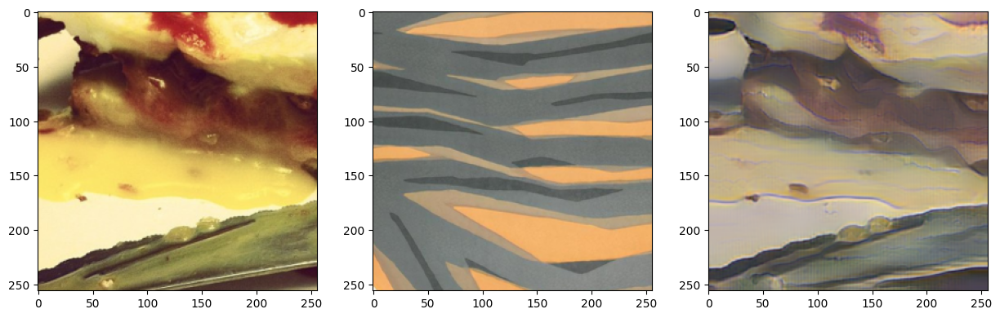

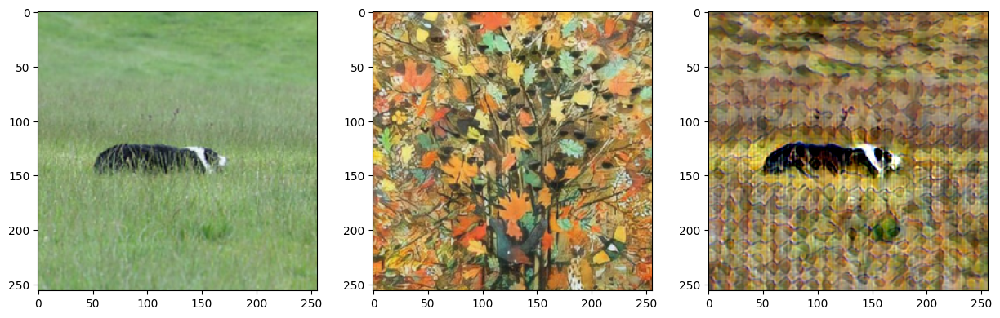

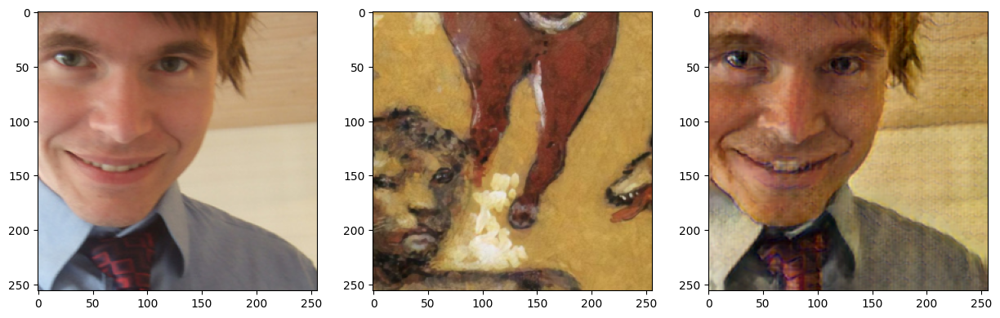

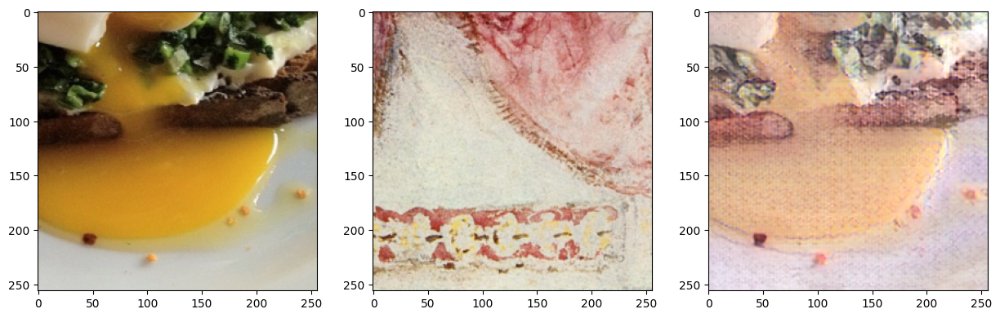

In [6]:
import matplotlib.pyplot as plt

for gen in imgs :
    fig, axs = plt.subplots(1,3, figsize=(15,5))
    for i in range(3) :
        axs[i].imshow(gen[i])
    plt.show()

In [19]:
wolf = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest.jpg')
van_gogh = Path('D:/StyleTransferAI/StyleTransferAI/test_images/van_gogh.jpg')
nature = Path('D:/StyleTransferAI/StyleTransferAI/test_images/nature.jpg')
wp = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wallpaper.jpg')
wolf_big = Path('D:/StyleTransferAI/StyleTransferAI/test_images/wolf_forest_big.jpg')
lion = Path('D:/StyleTransferAI/StyleTransferAI/test_images/lion.jpg')
fishes = Path('D:/StyleTransferAI/StyleTransferAI/test_images/peinture.webp')
drawing = Path('D:/StyleTransferAI/StyleTransferAI/test_images/croquis.jpg')

size = 1500

wolf_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(wolf))).unsqueeze(0)
sec_size = int((wolf_img.shape[2] / wolf_img.shape[1]) * size)
scaled_wolf = torch.nn.functional.interpolate(wolf_img.permute((0,3,1,2)), (size,sec_size), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

lion_img = torch.tensor(keras.utils.img_to_array(keras.utils.load_img(lion))).unsqueeze(0)
sec_size_lion = int((lion_img.shape[2] / lion_img.shape[1]) * size)
scaled_lion = torch.nn.functional.interpolate(lion_img.permute((0,3,1,2)), (size,sec_size_lion), mode='bilinear').type(torch.int).permute((0,2,3,1))[0]

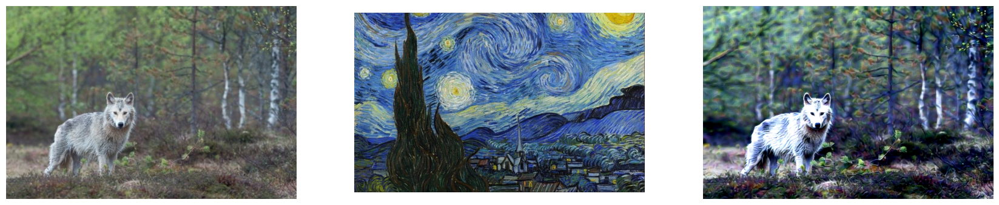

In [16]:
model.generate(scaled_wolf, van_gogh, show_img=True, show_inputs=True)

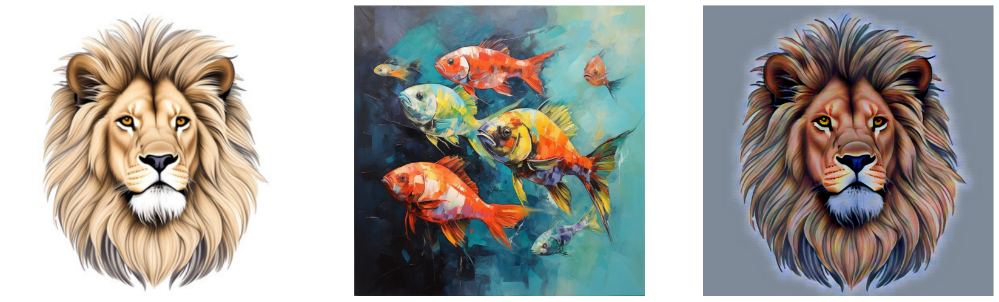

In [18]:
model.generate(scaled_lion, fishes, show_img=True, show_inputs=True)

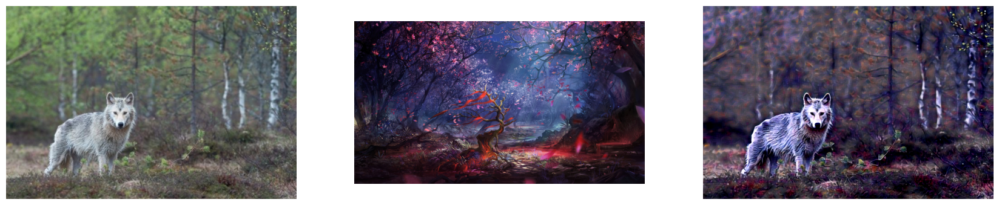

In [ ]:
model.generate(scaled_wolf, wp, show_img=True, show_inputs=True)

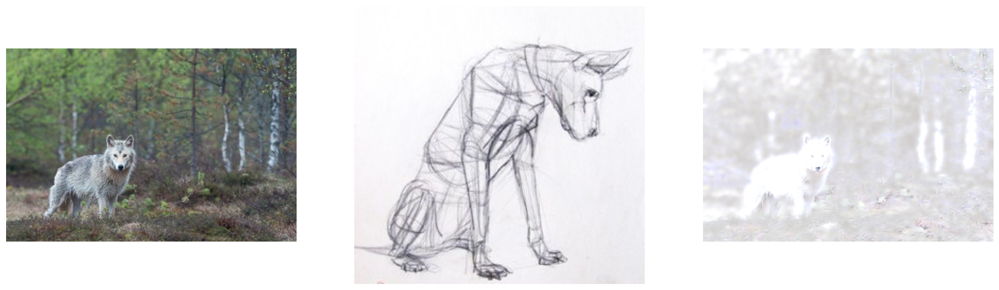

In [20]:
model.generate(scaled_wolf, drawing, show_img=True, show_inputs=True)

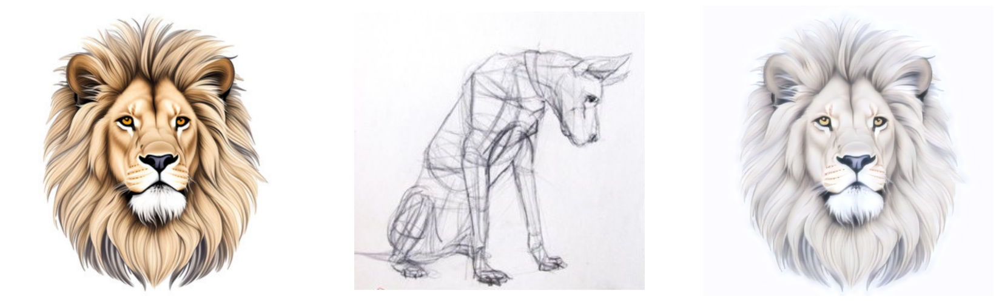

In [21]:
model.generate(scaled_lion, drawing, show_img=True, show_inputs=True)